In [16]:
#import necesary packages to run stats analyses on the data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats



# non-norm dataset


In [17]:
#open data
df = pd.read_csv('../../data/all_participants_merged correct.csv')
#df_norm = pd.read_csv('../../data/pair_features_overlap_high_discomfort_10hz_normalized.csv')
#get columns
cols = df.columns
print(cols)
#get features, anything from column 4 to the end
features = cols[4:]
#features = [f for f in features if 'r' in f]~
#remove features that have x, y or z but don't have the word "delta"
features_to_remove = [f for f in features if ('x' in f or'y' in f or 'z' in f) and 'delta' not in f]
features = [f for f in features if f not in features_to_remove]
print(features)
print(len(features))
classes = cols[2]
participant_col = cols[0]

#we can do all, or participant by participan

FileNotFoundError: [Errno 2] No such file or directory: '../../data/all_participants_merged correct.csv'

In [10]:
#check each feature for normality
for feature in features:
    print('-----------------------------------')
    print(feature)
    #get the data
    data = df[feature]
    #check for normality
    k2, p = stats.shapiro(data)
    alpha = 0.5
    print("p = {:g}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected")
    else:
        print("The null hypothesis cannot be rejected")
    #plot the data
    #sns.histplot(data, kde=True)
    #plt.show()


-----------------------------------
nose_x_delta
p = 3.0406e-145
The null hypothesis can be rejected
-----------------------------------
nose_y_delta
p = 4.37251e-142
The null hypothesis can be rejected
-----------------------------------
neck_x_delta
p = 9.54057e-146
The null hypothesis can be rejected
-----------------------------------
neck_y_delta
p = 2.43352e-145
The null hypothesis can be rejected
-----------------------------------
rightshoulder_x_delta
p = 1.61499e-145
The null hypothesis can be rejected
-----------------------------------
rightshoulder_y_delta
p = 1.38791e-144
The null hypothesis can be rejected
-----------------------------------
rightelbow_x_delta
p = 8.97062e-142
The null hypothesis can be rejected
-----------------------------------
rightelbow_y_delta
p = 1.88105e-141
The null hypothesis can be rejected
-----------------------------------
rightwrist_x_delta
p = 8.01783e-138
The null hypothesis can be rejected
-----------------------------------
rightwrist_

/tmp/ipykernel_132285/3853402446.py:8: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 28611.
  k2, p = stats.shapiro(data)


In [11]:
#now, the same but for data only from a single participant, participant by participant
participants = df[participant_col].unique()
for part in participants:
    print('-----------------------------------')
    print(part)
    #get the data
    data_p = df[df[participant_col] == part]
    #check each feature for normality
    for feature in features:
        print('-----------------------------------')
        print(feature)
        #get the data
        data = data_p[feature]
        #check for normality
        k2, p = stats.shapiro(data)
        alpha = 0.5
        print("p = {:g}".format(p))
        if p < alpha:  # null hypothesis: x comes from a normal distribution
            print("The null hypothesis can be rejected")
        else:
            print("The null hypothesis cannot be rejected")
        #plot the data
        #sns.histplot(data, kde=True)
        #plt.show()

-----------------------------------
1
-----------------------------------
nose_x_delta
p = 0.000268377
The null hypothesis can be rejected
-----------------------------------
nose_y_delta
p = 4.02906e-05
The null hypothesis can be rejected
-----------------------------------
neck_x_delta
p = 3.89165e-07
The null hypothesis can be rejected
-----------------------------------
neck_y_delta
p = 5.86092e-05
The null hypothesis can be rejected
-----------------------------------
rightshoulder_x_delta
p = 0.000280797
The null hypothesis can be rejected
-----------------------------------
rightshoulder_y_delta
p = 0.000123913
The null hypothesis can be rejected
-----------------------------------
rightelbow_x_delta
p = 0.0418933
The null hypothesis can be rejected
-----------------------------------
rightelbow_y_delta
p = 1.67946e-07
The null hypothesis can be rejected
-----------------------------------
rightwrist_x_delta
p = 5.20287e-09
The null hypothesis can be rejected
-------------------

/tmp/ipykernel_132285/141338067.py:15: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  k2, p = stats.shapiro(data)


p = 1.77992e-05
The null hypothesis can be rejected
-----------------------------------
leftelbow_y_delta
p = 5.39404e-07
The null hypothesis can be rejected
-----------------------------------
leftwrist_x_delta
p = 1.20681e-07
The null hypothesis can be rejected
-----------------------------------
leftwrist_y_delta
p = 4.35567e-07
The null hypothesis can be rejected
-----------------------------------
righteye_x_delta
p = 1.13969e-08
The null hypothesis can be rejected
-----------------------------------
righteye_y_delta
p = 8.00111e-10
The null hypothesis can be rejected
-----------------------------------
lefteye_x_delta
p = 2.3813e-07
The null hypothesis can be rejected
-----------------------------------
lefteye_y_delta
p = 9.02608e-07
The null hypothesis can be rejected
-----------------------------------
rightear_x_delta
p = 2.49926e-10
The null hypothesis can be rejected
-----------------------------------
rightear_y_delta
p = 3.78281e-10
The null hypothesis can be rejected
---

ValueError: Data must be at least length 3.

In [12]:
#now, assuming normality, do welsh t-test for each feature. save p values in database. then correct using bonferroni
p_values = {}
for feature in features:
    #print('-----------------------------------')
    #print(feature)
    #get the data
    data = df[feature]
    #get the classes
    classes = df['binary_label']
    data_0 = data[classes==0]
    data_1 = data[classes==1]
    #do the t-test
    t, p = stats.ttest_ind(data_0,data_1, equal_var=False)
    #print("p = {:g}".format(p))
    p_values[feature] = p

#correct p values
p_values_corrected = {}
for feature in p_values:
    p_values_corrected[feature] = p_values[feature] * len(p_values)

print(p_values_corrected)


sign_features = []
p_vals = []
for feature in p_values_corrected:
    print('-----------------------------------')
    print(feature)
    print(p_values_corrected[feature])
    if p_values_corrected[feature] < 0.05:
        print('Significant')
        sign_features.append(feature)
        p_vals.append(p_values_corrected[feature])
    else:
        print('Not significant')
    
print(sign_features)
print(len(sign_features))

{'nose_x_delta': 62.90745177934053, 'nose_y_delta': 14.131639918504357, 'neck_x_delta': 60.869083898853646, 'neck_y_delta': 63.36980395029246, 'rightshoulder_x_delta': 45.62438630484591, 'rightshoulder_y_delta': 42.01895666872643, 'rightelbow_x_delta': 65.46676213662012, 'rightelbow_y_delta': 61.72141302143133, 'rightwrist_x_delta': 65.88654490469219, 'rightwrist_y_delta': 66.72638903911071, 'leftshoulder_x_delta': 64.03866385217107, 'leftshoulder_y_delta': 58.76837931456758, 'leftelbow_x_delta': 53.14628539765554, 'leftelbow_y_delta': 52.01875242611478, 'leftwrist_x_delta': 48.9523254275485, 'leftwrist_y_delta': 50.9793610155882, 'righteye_x_delta': 64.55452836848298, 'righteye_y_delta': 32.4915538838326, 'lefteye_x_delta': 62.34341690483603, 'lefteye_y_delta': 23.51162155027298, 'rightear_x_delta': 63.23034773234475, 'rightear_y_delta': 63.35349488126646, 'leftear_x_delta': 51.797844253567945, 'leftear_y_delta': 55.878862999667575, ' AU01_r': 0.03484825867734633, ' AU02_r': 3.0407871

-----------------------------------
nose_x


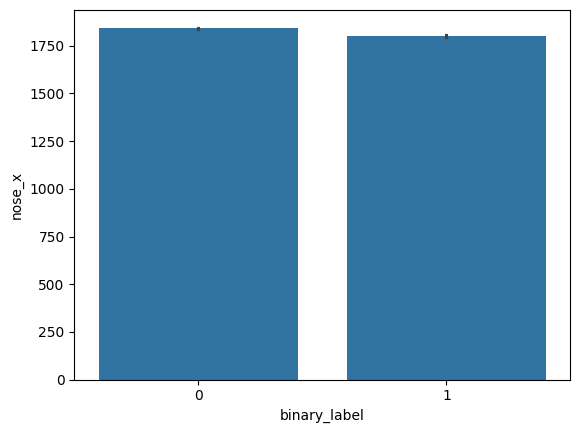

-----------------------------------
nose_y


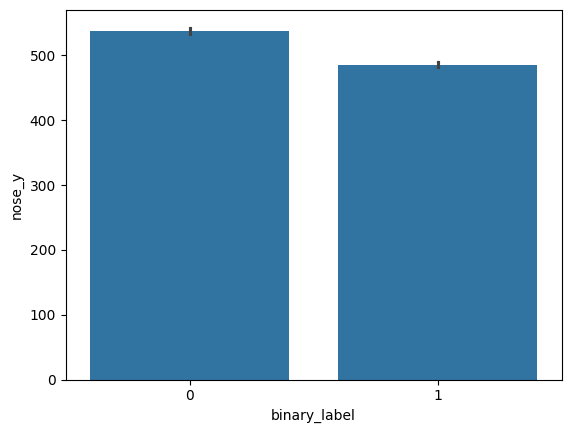

-----------------------------------
neck_x


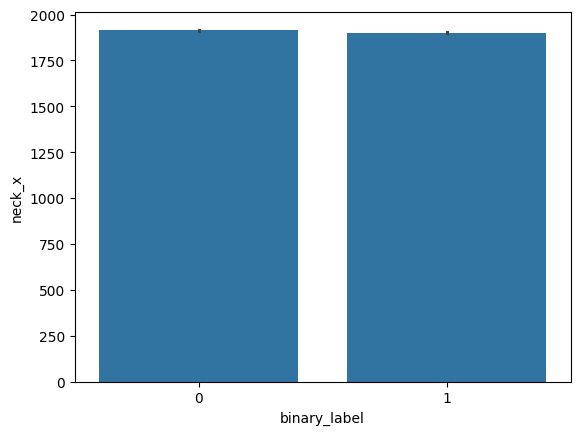

-----------------------------------
rightshoulder_x


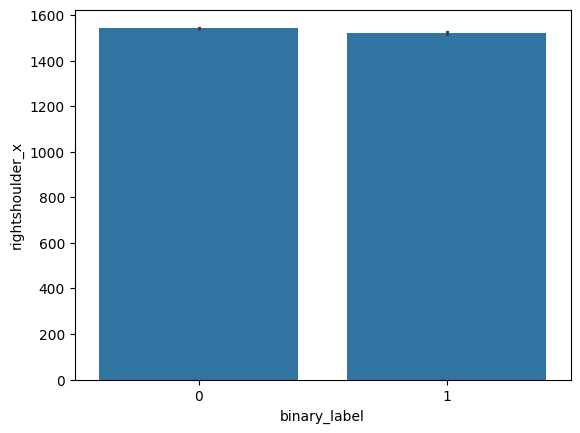

-----------------------------------
rightelbow_x


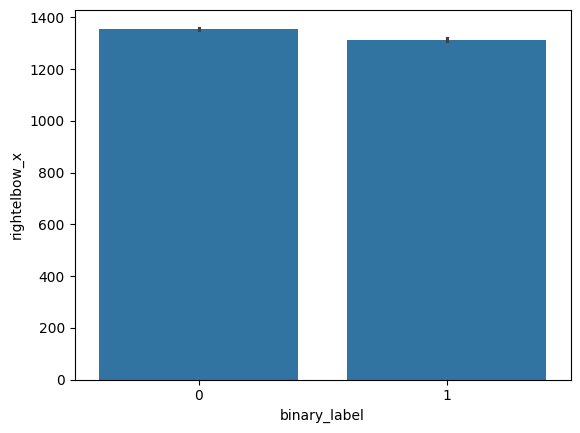

-----------------------------------
rightelbow_y


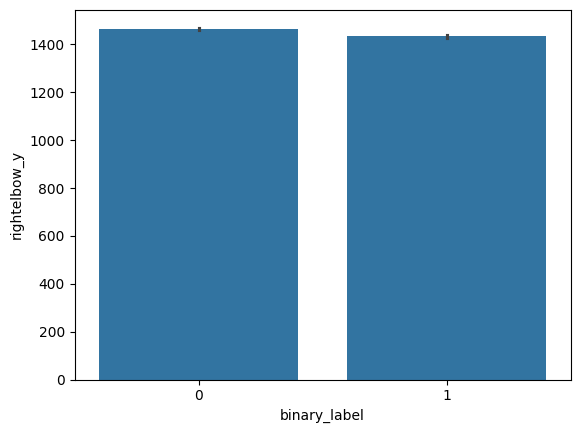

-----------------------------------
rightwrist_x


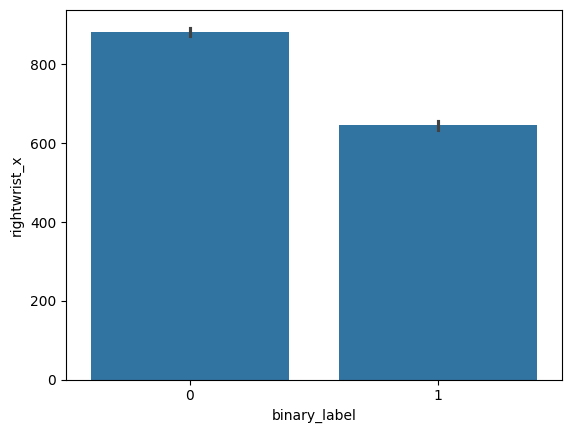

-----------------------------------
rightwrist_y


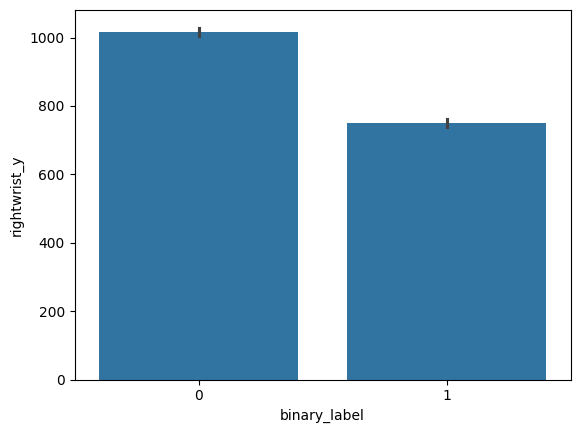

-----------------------------------
leftelbow_x


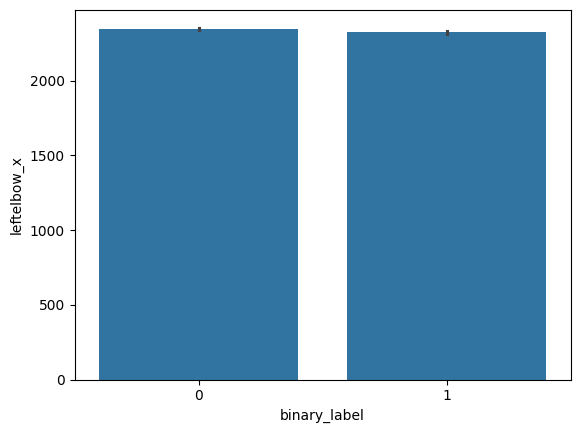

-----------------------------------
leftwrist_x


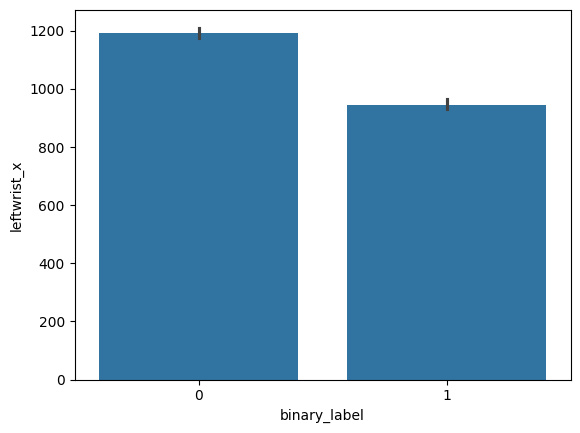

-----------------------------------
leftwrist_y


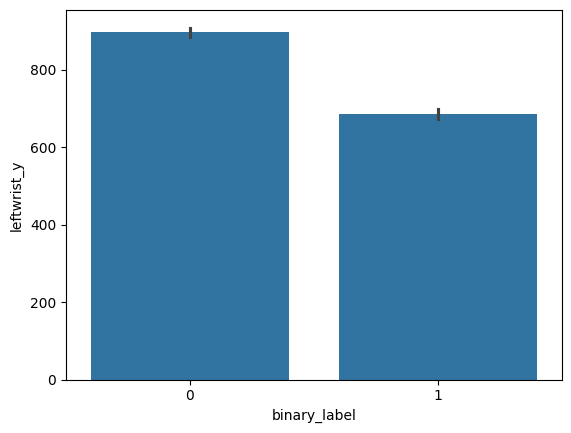

-----------------------------------
righteye_x


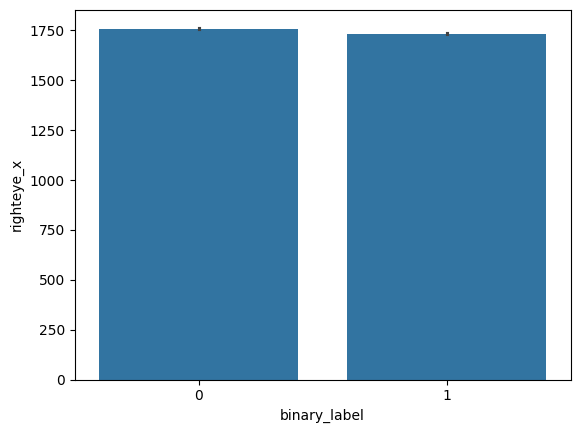

-----------------------------------
righteye_y


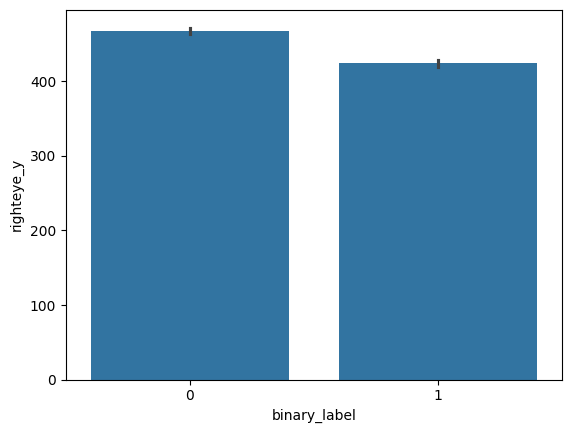

-----------------------------------
lefteye_x


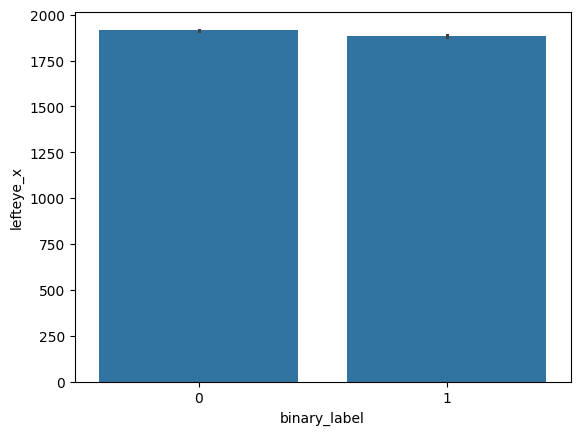

-----------------------------------
lefteye_y


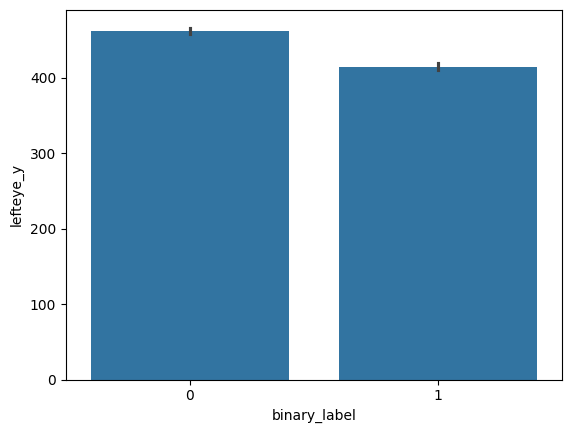

-----------------------------------
rightear_x


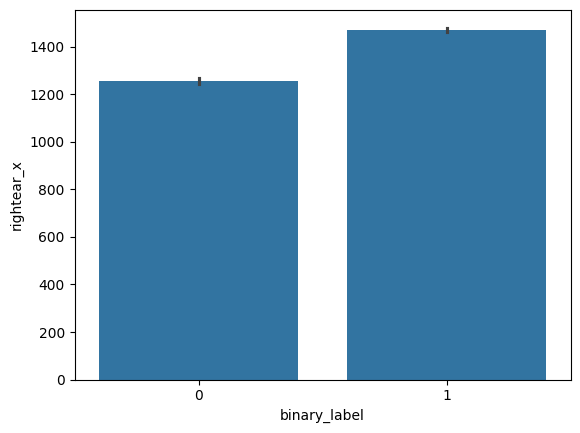

-----------------------------------
rightear_y


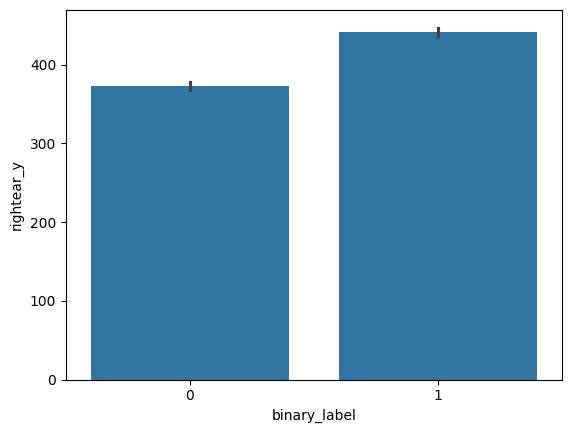

-----------------------------------
leftear_x


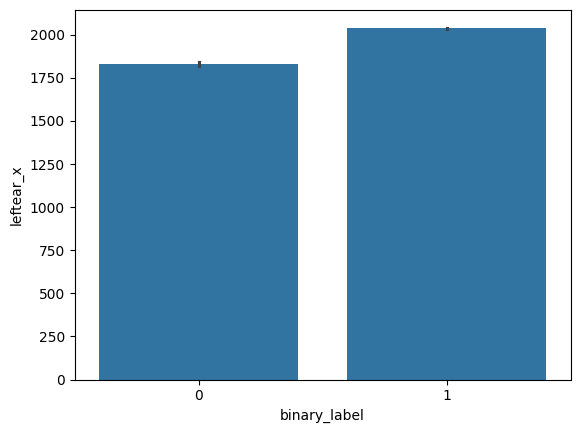

-----------------------------------
leftear_y


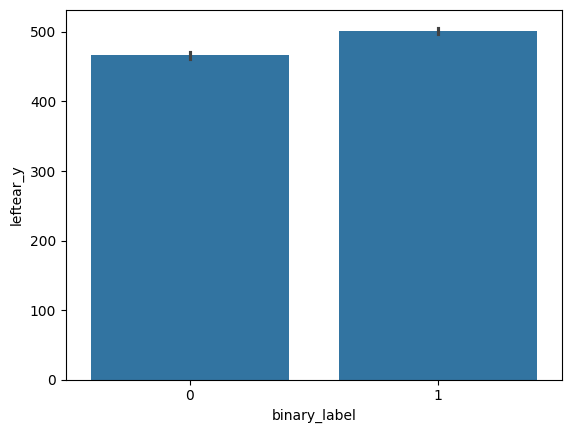

-----------------------------------
 AU01_r


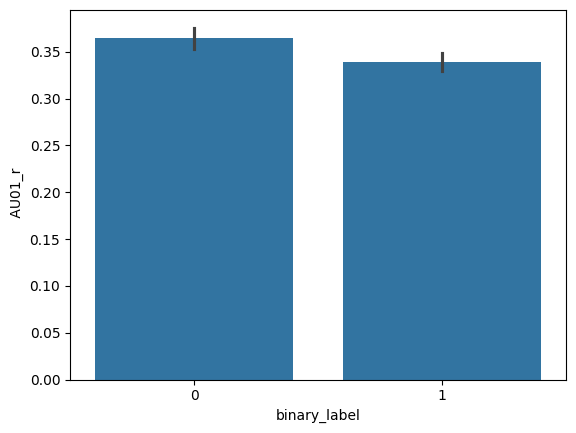

-----------------------------------
 AU02_r


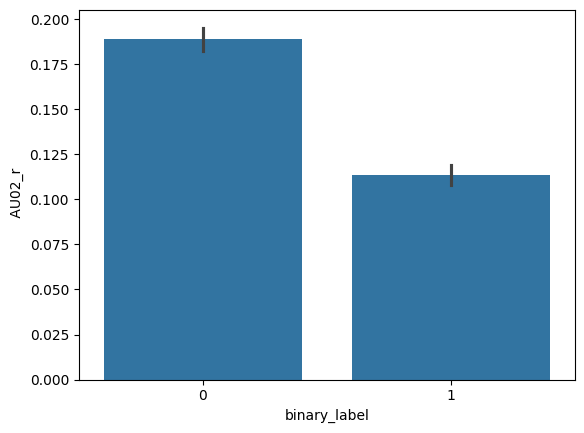

-----------------------------------
 AU04_r


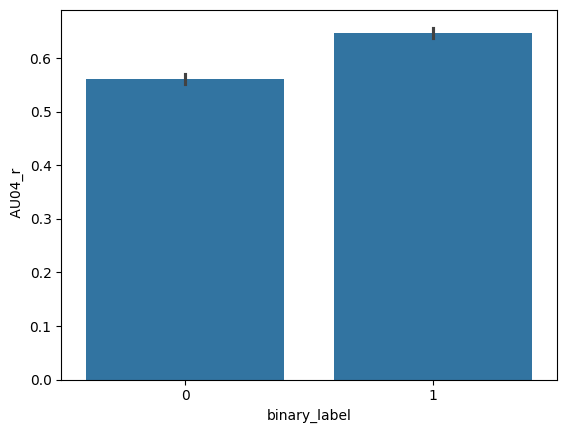

-----------------------------------
 AU05_r


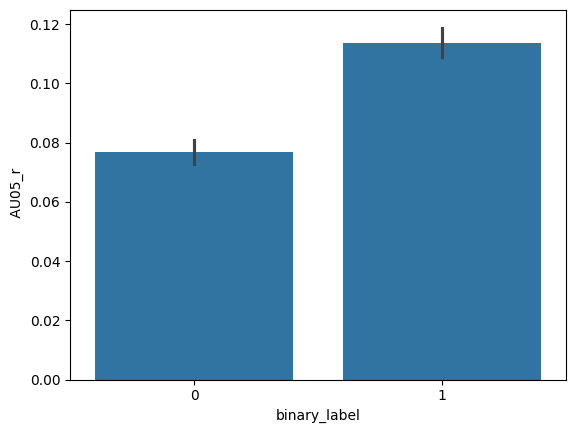

-----------------------------------
 AU06_r


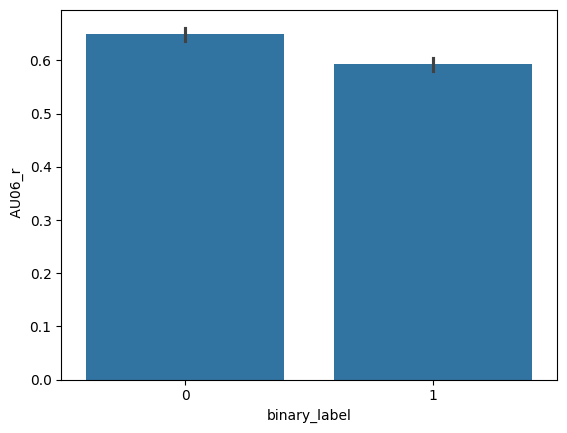

-----------------------------------
 AU09_r


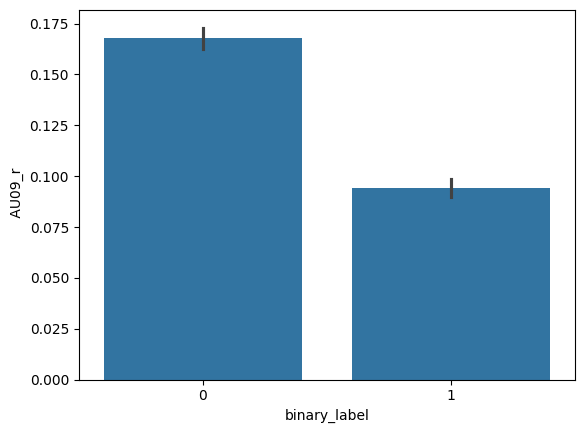

-----------------------------------
 AU10_r


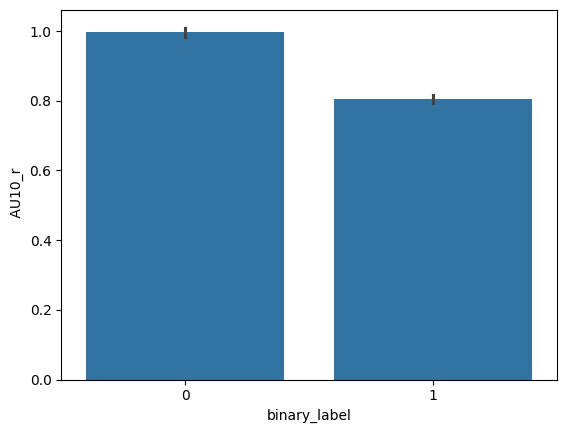

-----------------------------------
 AU14_r


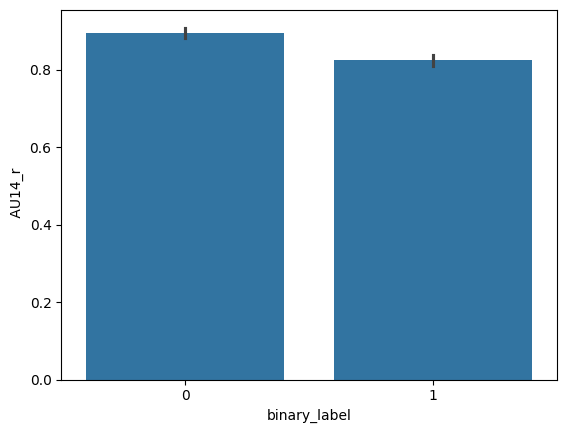

-----------------------------------
 AU15_r


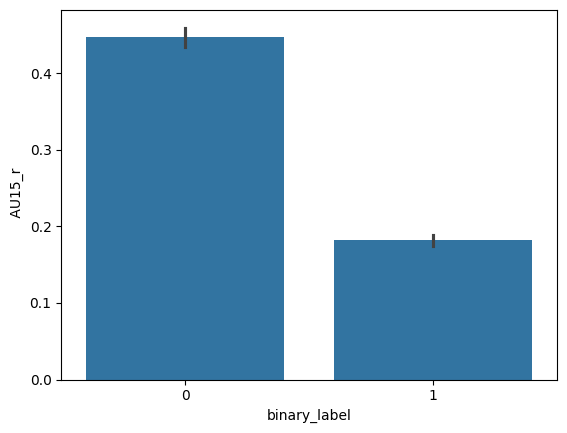

-----------------------------------
 AU20_r


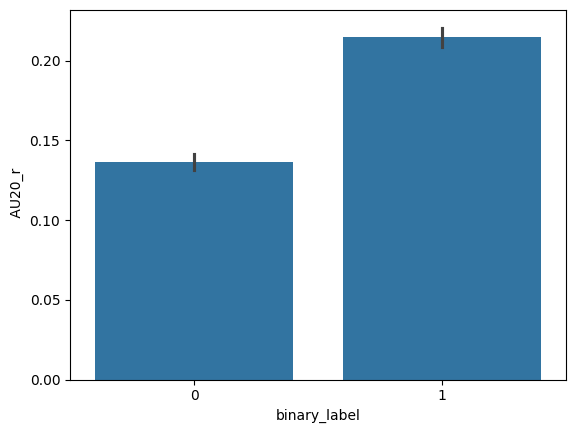

-----------------------------------
 AU23_r


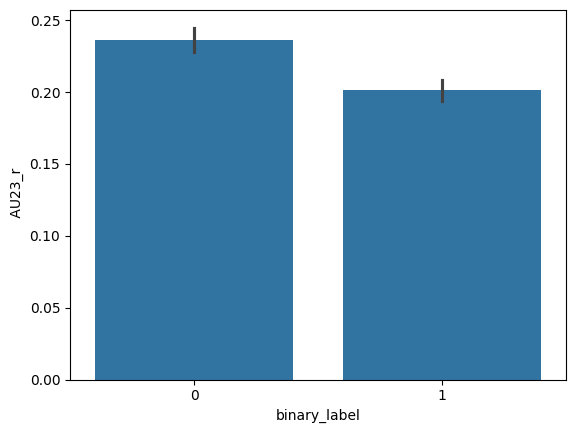

-----------------------------------
 AU25_r


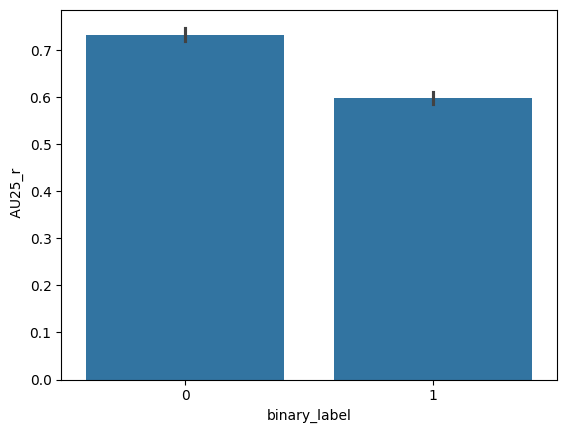

-----------------------------------
 AU26_r


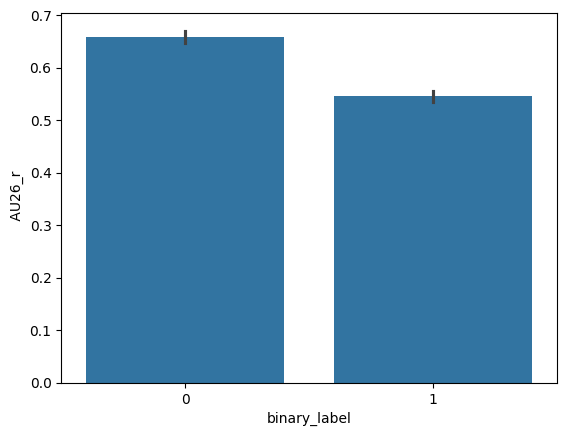

-----------------------------------
 AU02_c


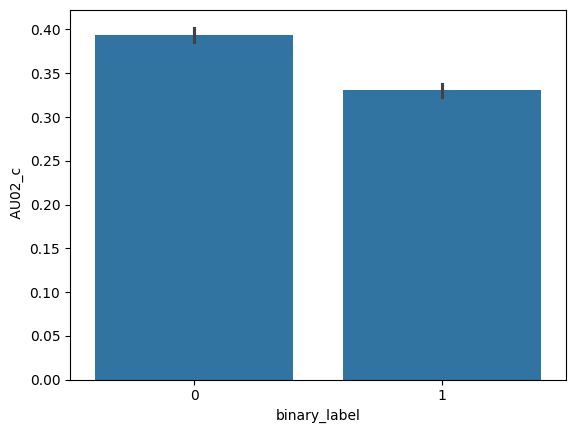

-----------------------------------
 AU04_c


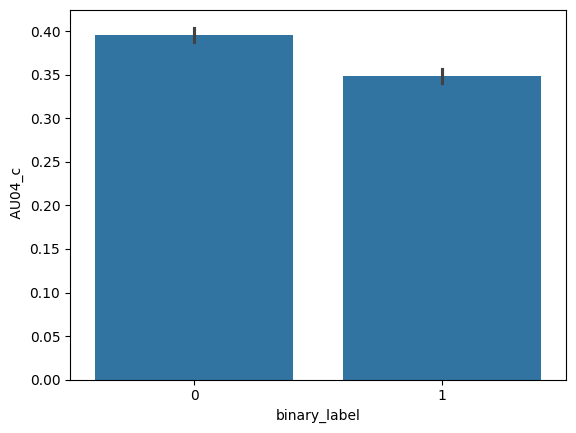

-----------------------------------
 AU05_c


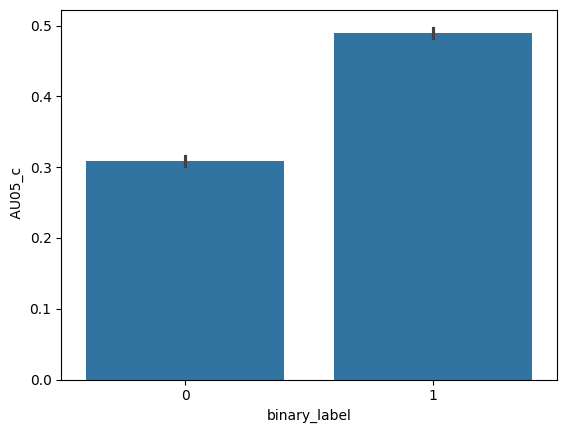

-----------------------------------
 AU06_c


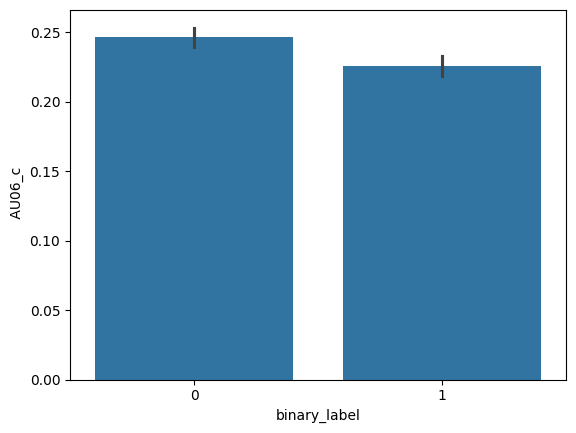

-----------------------------------
 AU09_c


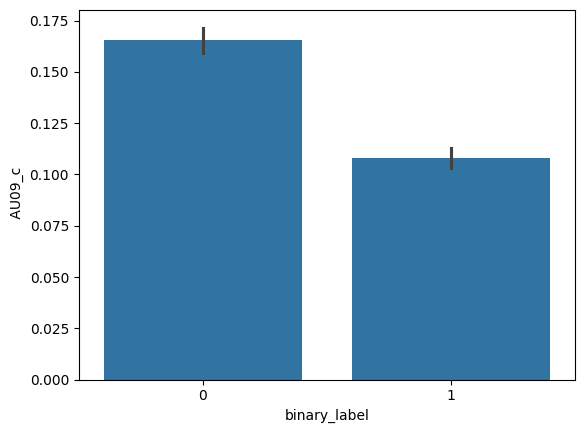

-----------------------------------
 AU10_c


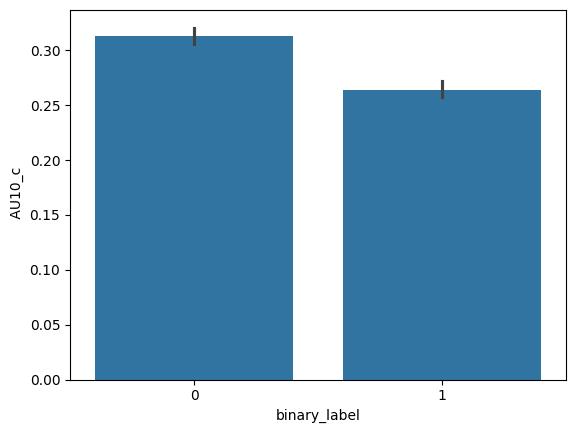

-----------------------------------
 AU14_c


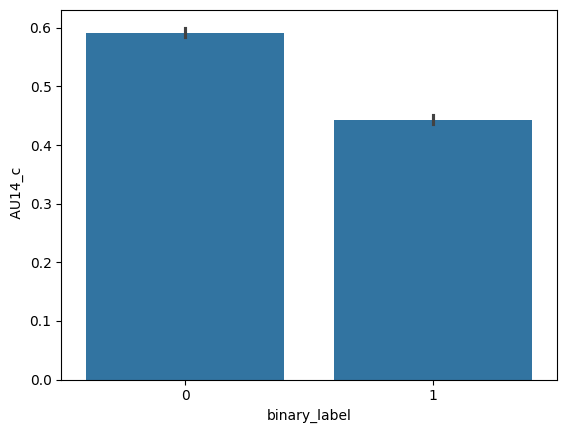

-----------------------------------
 AU15_c


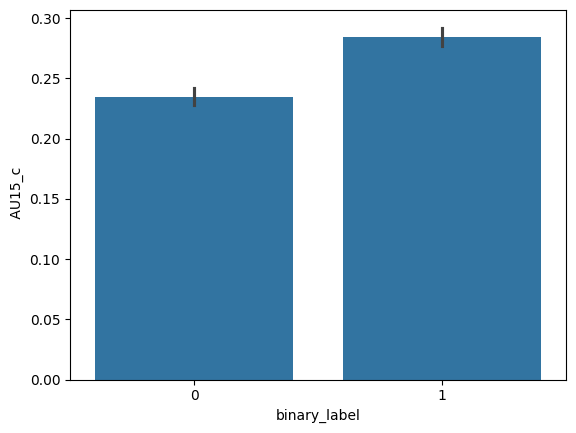

-----------------------------------
 AU20_c


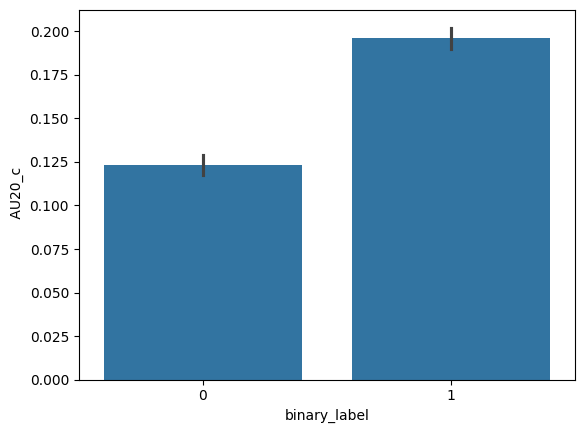

-----------------------------------
 AU23_c


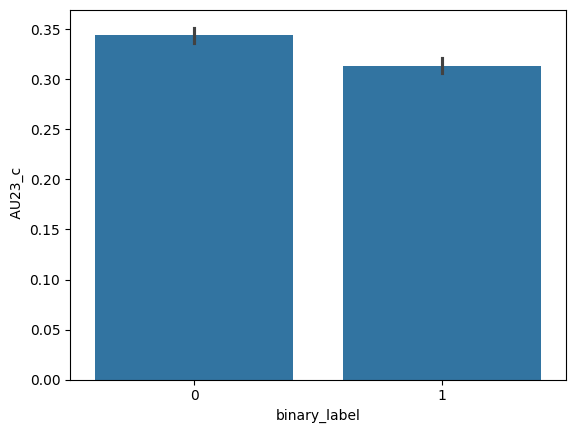

-----------------------------------
 AU25_c


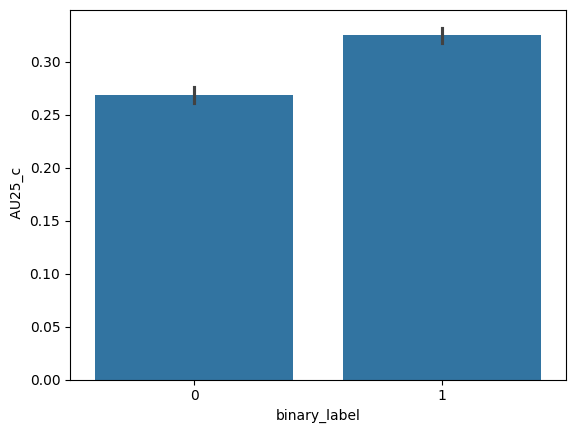

-----------------------------------
 AU26_c


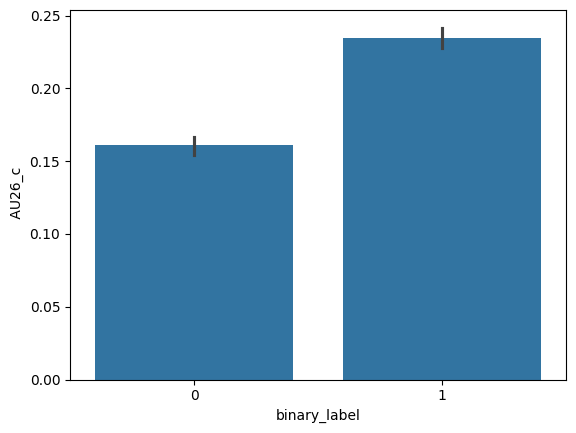

-----------------------------------
 AU28_c


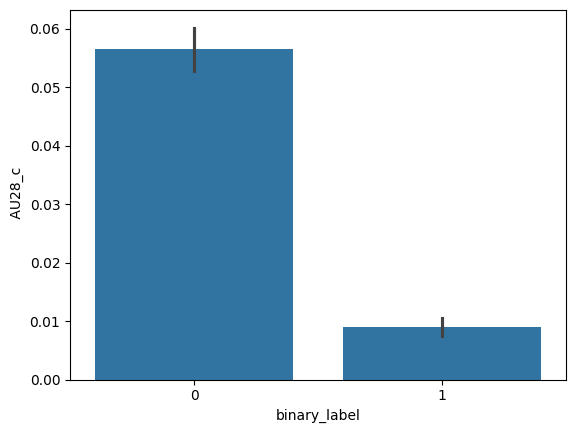

-----------------------------------
Loudness_sma3


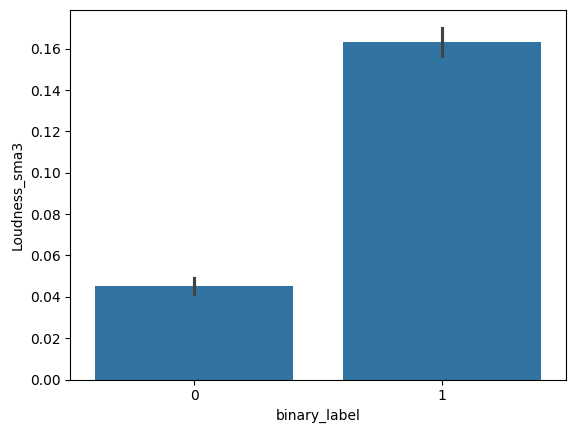

-----------------------------------
alphaRatio_sma3


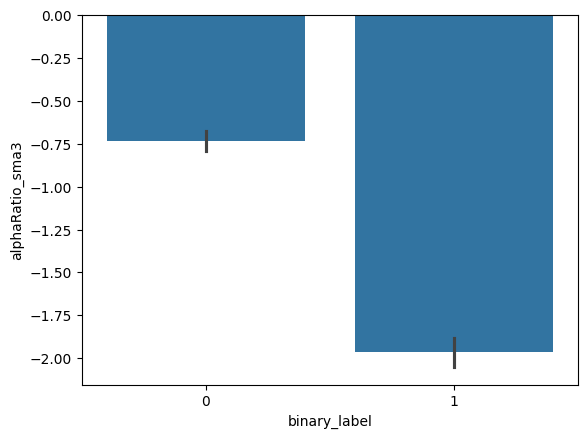

-----------------------------------
hammarbergIndex_sma3


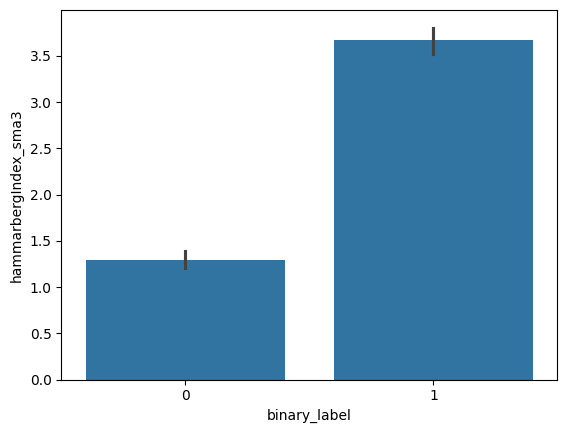

-----------------------------------
slope500-1500_sma3


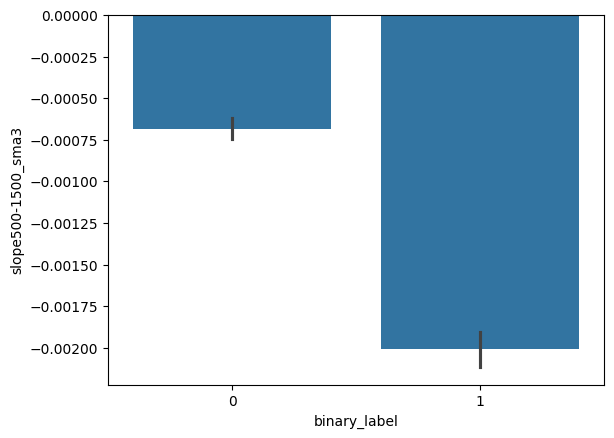

-----------------------------------
spectralFlux_sma3


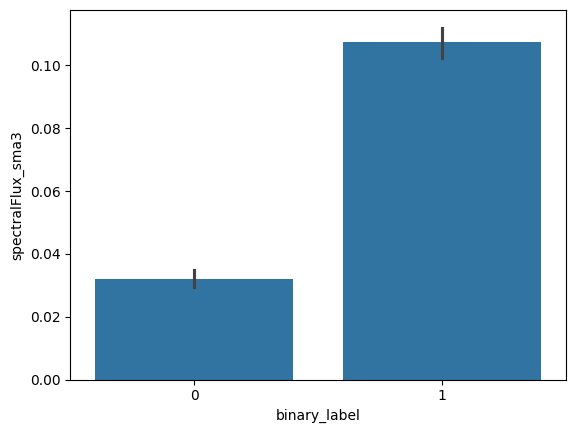

-----------------------------------
mfcc1_sma3


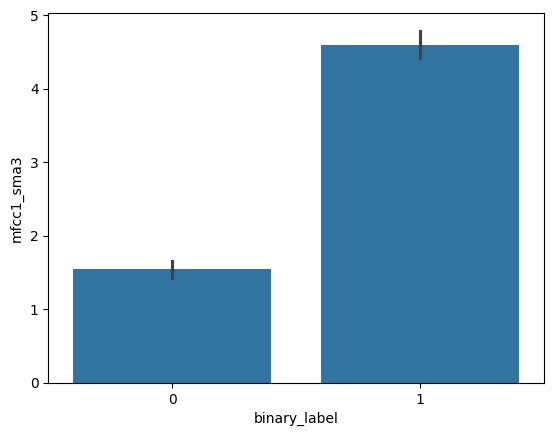

-----------------------------------
mfcc3_sma3


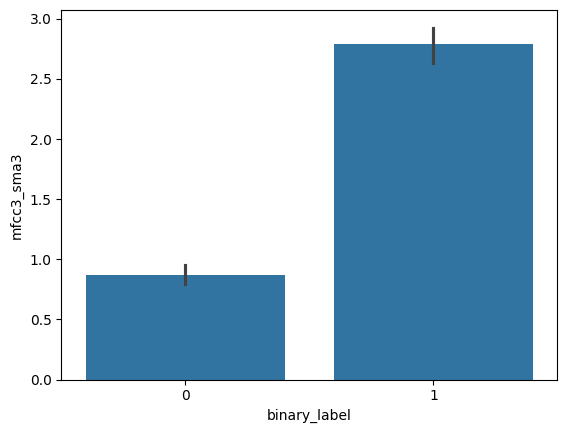

-----------------------------------
mfcc4_sma3


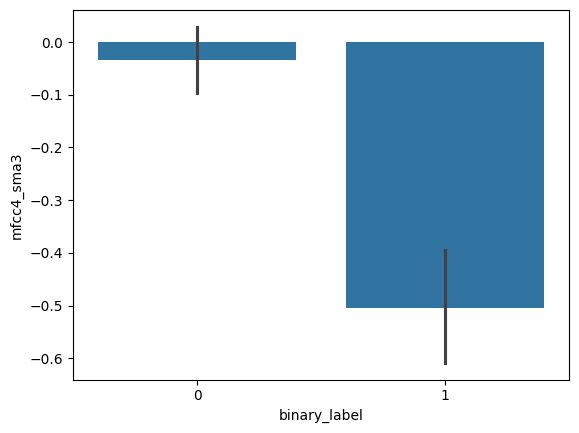

-----------------------------------
F0semitoneFrom27.5Hz_sma3nz


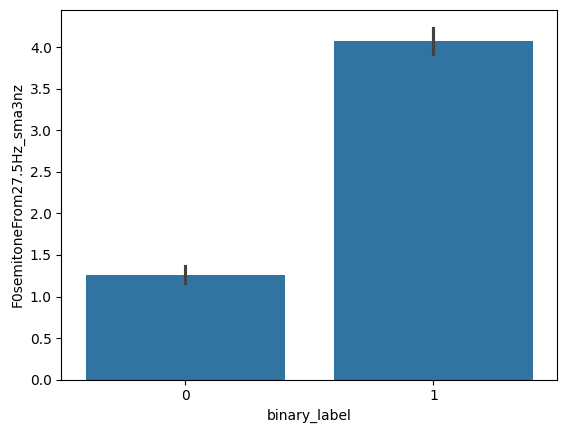

-----------------------------------
jitterLocal_sma3nz


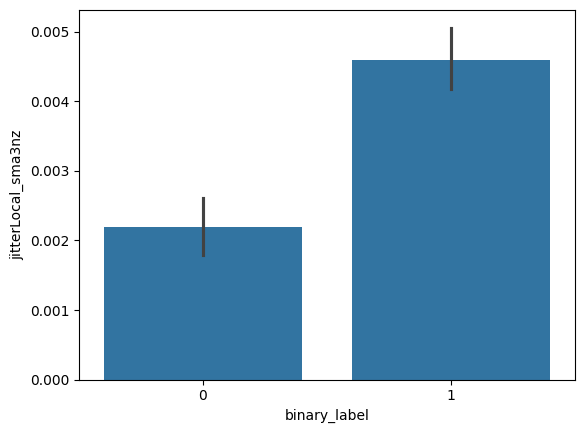

-----------------------------------
shimmerLocaldB_sma3nz


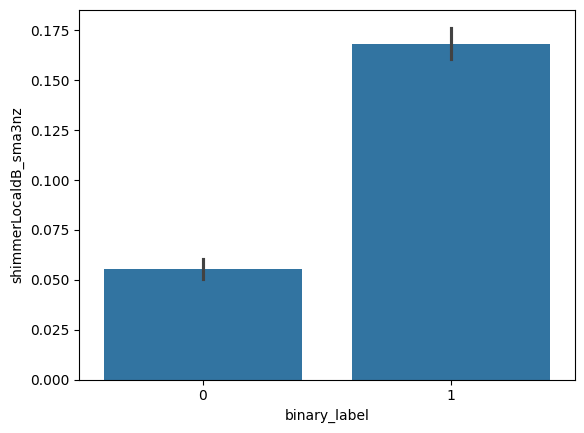

-----------------------------------
HNRdBACF_sma3nz


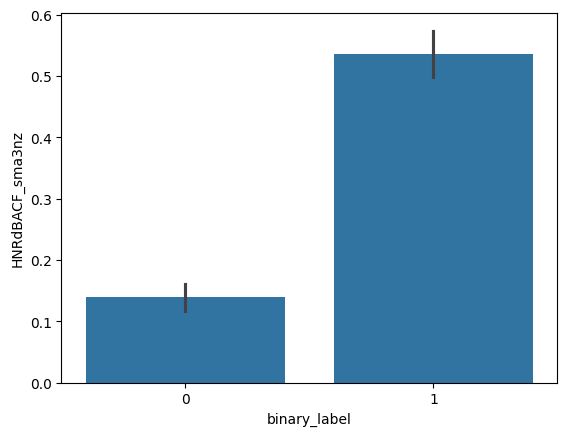

-----------------------------------
logRelF0-H1-H2_sma3nz


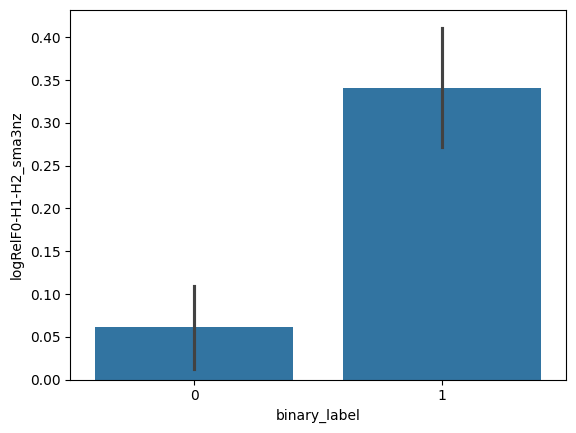

-----------------------------------
logRelF0-H1-A3_sma3nz


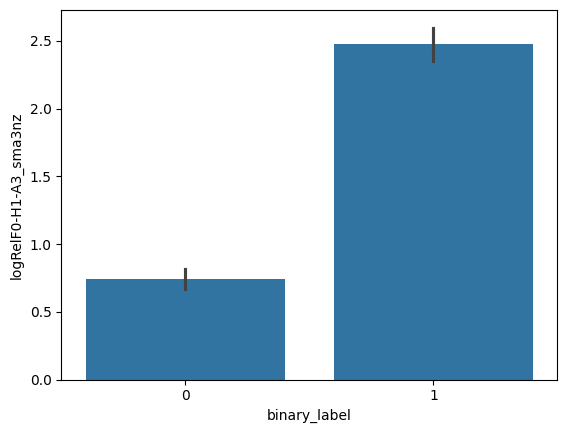

-----------------------------------
F1frequency_sma3nz


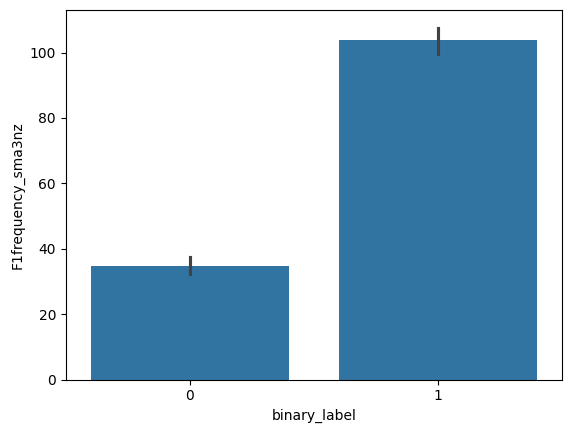

-----------------------------------
F1bandwidth_sma3nz


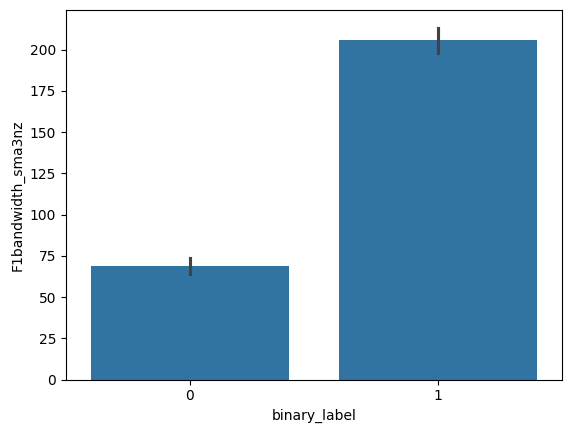

-----------------------------------
F1amplitudeLogRelF0_sma3nz


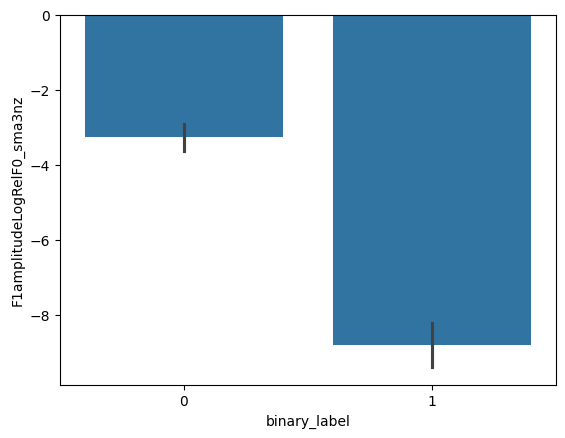

-----------------------------------
F2frequency_sma3nz


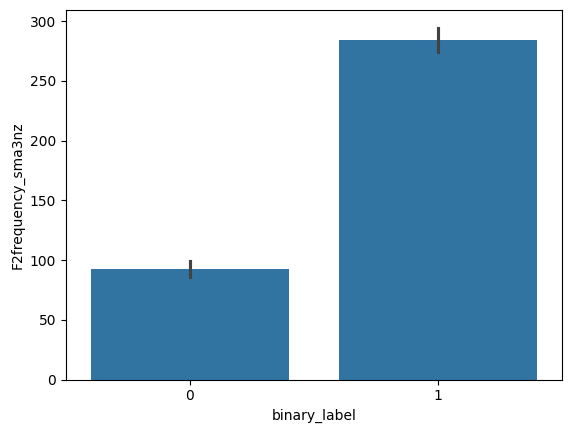

-----------------------------------
F2bandwidth_sma3nz


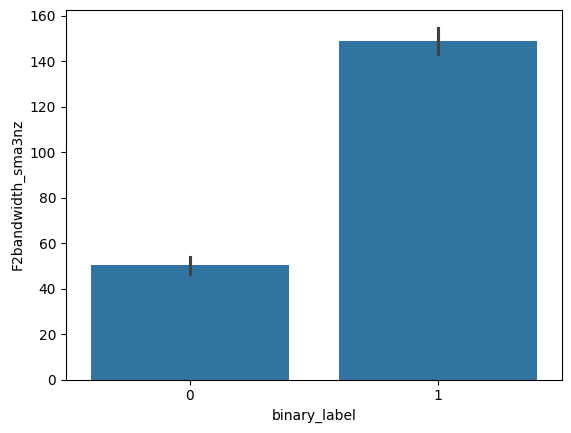

-----------------------------------
F2amplitudeLogRelF0_sma3nz


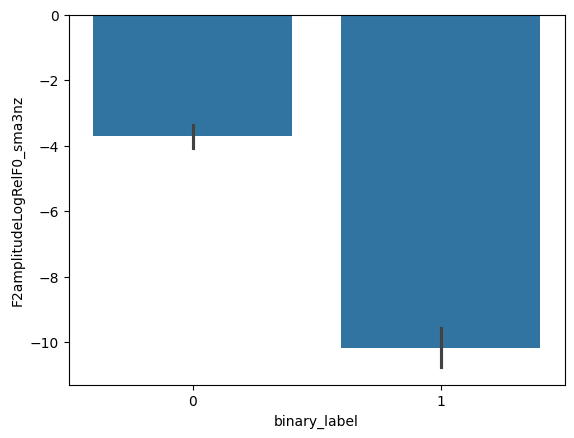

-----------------------------------
F3frequency_sma3nz


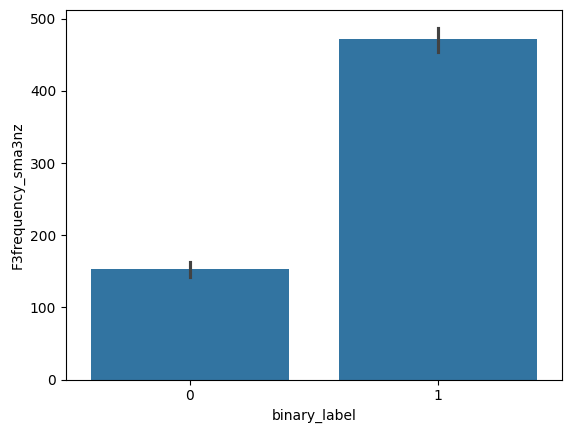

-----------------------------------
F3bandwidth_sma3nz


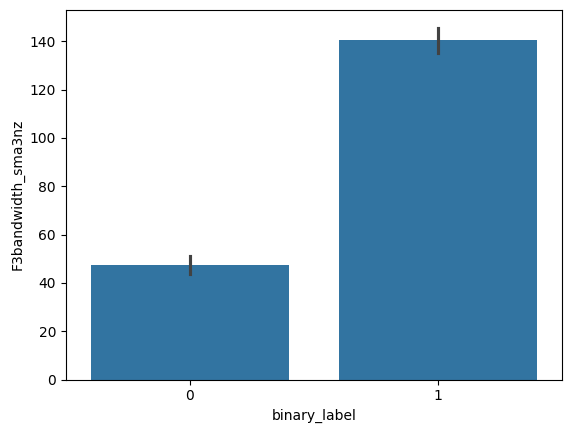

-----------------------------------
F3amplitudeLogRelF0_sma3nz


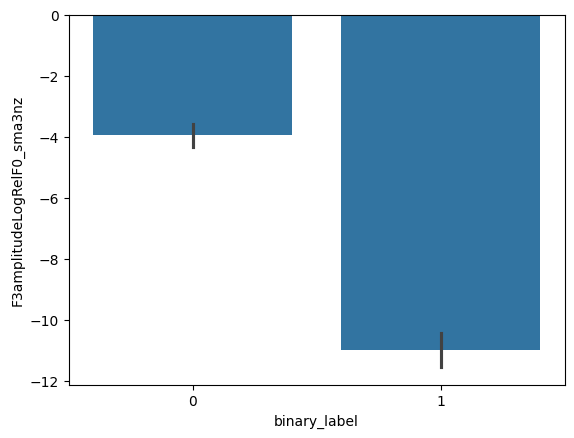

In [8]:
#for each significant feature, plot the data in a bar plot to see the difference

for feature in sign_features:
    print('-----------------------------------')
    print(feature)
    #get the data
    data = df[feature]
    #get the classes
    classes = df['binary_label']
    data_0 = data[classes==0]
    data_1 = data[classes==1]
    #plot the data
    sns.barplot(x=classes, y=data)
    plt.show()


In [26]:
#make it into a df as save as csv
df_sign = pd.DataFrame()
df_sign['feature'] = sign_features
df_sign['p_value'] = p_vals
df_sign.to_csv('sign_features_ttest_full.csv', index=False)

# Normalized Dataset

In [16]:
#open data
#df = pd.read_csv('../../data/pair_features_overlap_high_discomfort_10hz_clean.csv')
df= pd.read_csv('../../data/pair_features_overlap_high_discomfort_10hz_normalized.csv')
#get columns
cols = df.columns
print(cols)
#get features, anything from column 4 to the end
features = cols[3:]
#features = [f for f in features if 'r' in f]
print(features)
print(len(features))
classes = cols[2]
participant_col = cols[0]

#we can do all, or participant by participant

Index(['pair_id', 'start_seconds', 'is_discomfort', 'F0final_sma_p1',
       'voicingFinalUnclipped_sma_p1', 'jitterLocal_sma_p1',
       'jitterDDP_sma_p1', 'shimmerLocal_sma_p1', 'logHNR_sma_p1',
       'audspec_lengthL1norm_sma_p1',
       ...
       'leftknee_c_avg_p2', 'nose_y_avg_p2', 'leftknee_x_avg_p2',
       'rightwrist_c_avg_p2', 'midhip_x_avg_p2', 'leftshoulder_c_avg_p2',
       'leftwrist_c_avg_p2', 'midhip_y_avg_p2', 'rightelbow_c_avg_p2',
       'rightknee_x_avg_p2'],
      dtype='object', length=344)
Index(['F0final_sma_p1', 'voicingFinalUnclipped_sma_p1', 'jitterLocal_sma_p1',
       'jitterDDP_sma_p1', 'shimmerLocal_sma_p1', 'logHNR_sma_p1',
       'audspec_lengthL1norm_sma_p1', 'audspecRasta_lengthL1norm_sma_p1',
       'pcm_RMSenergy_sma_p1', 'pcm_zcr_sma_p1',
       ...
       'leftknee_c_avg_p2', 'nose_y_avg_p2', 'leftknee_x_avg_p2',
       'rightwrist_c_avg_p2', 'midhip_x_avg_p2', 'leftshoulder_c_avg_p2',
       'leftwrist_c_avg_p2', 'midhip_y_avg_p2', 'rightelbo

In [17]:
#check each feature for normality
for feature in features:
    print('-----------------------------------')
    print(feature)
    #get the data
    data = df[feature]
    #check for normality
    k2, p = stats.shapiro(data)
    alpha = 0.5
    print("p = {:g}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected")
    else:
        print("The null hypothesis cannot be rejected")
    #plot the data
    #sns.histplot(data, kde=True)
    #plt.show()


-----------------------------------
F0final_sma_p1
p = 8.39769e-195
The null hypothesis can be rejected
-----------------------------------
voicingFinalUnclipped_sma_p1
p = 1.69138e-193
The null hypothesis can be rejected
-----------------------------------
jitterLocal_sma_p1
p = 1.13755e-197
The null hypothesis can be rejected
-----------------------------------
jitterDDP_sma_p1
p = 1.58335e-198
The null hypothesis can be rejected
-----------------------------------
shimmerLocal_sma_p1
p = 2.28985e-194
The null hypothesis can be rejected
-----------------------------------
logHNR_sma_p1
p = 7.55557e-201
The null hypothesis can be rejected
-----------------------------------
audspec_lengthL1norm_sma_p1
p = 8.34169e-198
The null hypothesis can be rejected
-----------------------------------
audspecRasta_lengthL1norm_sma_p1
p = 1.88956e-195
The null hypothesis can be rejected
-----------------------------------
pcm_RMSenergy_sma_p1
p = 2.25471e-198
The null hypothesis can be rejected
---

/tmp/ipykernel_111423/3853402446.py:8: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 274076.
  k2, p = stats.shapiro(data)


p = 7.49196e-198
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[17]_p1
p = 6.65363e-198
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[18]_p1
p = 3.20269e-197
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[19]_p1
p = 3.28455e-197
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[20]_p1
p = 1.42101e-196
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[21]_p1
p = 2.02662e-195
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[22]_p1
p = 9.13048e-196
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[23]_p1
p = 3.9151e-196
The null hypothesis can be rejected
-----------------------------------
audSpec_Rfilt_sma[24]_p1
p = 2.12094e-195
The null hypothesis can be rejected
-----------------------------------


In [18]:
#now, the same but for data only from a single participant, participant by participant
participants = df[participant_col].unique()
for part in participants:
    print('-----------------------------------')
    print(part)
    #get the data
    data_p = df[df[participant_col] == part]
    #check each feature for normality
    for feature in features:
        print('-----------------------------------')
        print(feature)
        #get the data
        data = data_p[feature]
        #check for normality
        k2, p = stats.shapiro(data)
        alpha = 0.5
        print("p = {:g}".format(p))
        if p < alpha:  # null hypothesis: x comes from a normal distribution
            print("The null hypothesis can be rejected")
        else:
            print("The null hypothesis cannot be rejected")
        #plot the data
        #sns.histplot(data, kde=True)
        #plt.show()

-----------------------------------
1001
-----------------------------------
F0final_sma_p1
p = 8.85832e-148
The null hypothesis can be rejected
-----------------------------------
voicingFinalUnclipped_sma_p1
p = 1.91632e-147
The null hypothesis can be rejected
-----------------------------------
jitterLocal_sma_p1
p = 1.61339e-149
The null hypothesis can be rejected
-----------------------------------
jitterDDP_sma_p1
p = 7.0517e-150
The null hypothesis can be rejected
-----------------------------------
shimmerLocal_sma_p1
p = 7.31469e-148
The null hypothesis can be rejected
-----------------------------------
logHNR_sma_p1
p = 6.25917e-152
The null hypothesis can be rejected
-----------------------------------
audspec_lengthL1norm_sma_p1
p = 1.34284e-148
The null hypothesis can be rejected
-----------------------------------
audspecRasta_lengthL1norm_sma_p1
p = 9.48161e-148
The null hypothesis can be rejected
-----------------------------------
pcm_RMSenergy_sma_p1
p = 3.3069e-149


/tmp/ipykernel_111423/141338067.py:15: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 41964.
  k2, p = stats.shapiro(data)


p = 6.44622e-149
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralCentroid_sma_p2
p = 7.18589e-152
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralEntropy_sma_p2
p = 3.4439e-147
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralVariance_sma_p2
p = 5.17596e-156
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralSkewness_sma_p2
p = 9.99144e-151
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralKurtosis_sma_p2
p = 1.93771e-153
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralSlope_sma_p2
p = 1.87056e-153
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_psySharpness_sma_p2
p = 4.14231e-150
The null hypothesis can be rejected
-----------------------------------
pcm_fftMag_spectralHarmonicity_sma_p2
p = 1.93764e-1

/tmp/ipykernel_111423/141338067.py:15: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  k2, p = stats.shapiro(data)
/tmp/ipykernel_111423/141338067.py:15: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 59154.
  k2, p = stats.shapiro(data)


p = 1
The null hypothesis cannot be rejected
-----------------------------------
logHNR_sma_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
audspec_lengthL1norm_sma_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
audspecRasta_lengthL1norm_sma_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
pcm_RMSenergy_sma_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
pcm_zcr_sma_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
audSpec_Rfilt_sma[0]_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
audSpec_Rfilt_sma[1]_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
audSpec_Rfilt_sma[2]_p2
p = 1
The null hypothesis cannot be rejected
-----------------------------------
audSpec_Rfilt_sma[3]_p2
p = 1
The null hypothesis cannot be rejected
-------------------

/tmp/ipykernel_111423/141338067.py:15: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 64412.
  k2, p = stats.shapiro(data)


p = 1.5591e-112
The null hypothesis can be rejected
-----------------------------------
pose_Tz_avg_p1
p = 4.57981e-141
The null hypothesis can be rejected
-----------------------------------
pose_Rx_avg_p1
p = 8.78575e-107
The null hypothesis can be rejected
-----------------------------------
pose_Ry_avg_p1
p = 4.20082e-51
The null hypothesis can be rejected
-----------------------------------
pose_Rz_avg_p1
p = 2.73243e-91
The null hypothesis can be rejected
-----------------------------------
AU01_r_avg_p1
p = 7.33861e-122
The null hypothesis can be rejected
-----------------------------------
AU02_r_avg_p1
p = 2.82787e-139
The null hypothesis can be rejected
-----------------------------------
AU04_r_avg_p1
p = 1.21791e-80
The null hypothesis can be rejected
-----------------------------------
AU05_r_avg_p1
p = 3.83584e-144
The null hypothesis can be rejected
-----------------------------------
AU06_r_avg_p1
p = 1.42926e-108
The null hypothesis can be rejected
--------------------

/tmp/ipykernel_111423/141338067.py:15: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 43410.
  k2, p = stats.shapiro(data)


p = 1.87646e-132
The null hypothesis can be rejected
-----------------------------------
Gyroscope Z CAL
p = 4.99964e-144
The null hypothesis can be rejected
-----------------------------------
Internal ADC A13 CAL
p = 4.00835e-122
The null hypothesis can be rejected
-----------------------------------
GSR CAL
p = 2.02613e-117
The null hypothesis can be rejected
-----------------------------------
GSR Conductance CAL
p = 5.08371e-122
The null hypothesis can be rejected
-----------------------------------
Heart Rate PPG
p = 1.49217e-143
The null hypothesis can be rejected
-----------------------------------
IBI PPG
p = 5.73312e-133
The null hypothesis can be rejected
-----------------------------------
gaze_0_x_avg_p2
p = 1.47628e-75
The null hypothesis can be rejected
-----------------------------------
gaze_0_y_avg_p2
p = 4.15261e-61
The null hypothesis can be rejected
-----------------------------------
gaze_0_z_avg_p2
p = 2.9891e-84
The null hypothesis can be rejected
--------------

/tmp/ipykernel_111423/141338067.py:15: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 65136.
  k2, p = stats.shapiro(data)


p = 1.02545e-96
The null hypothesis can be rejected
-----------------------------------
gaze_angle_y_avg_p1
p = 1.445e-106
The null hypothesis can be rejected
-----------------------------------
pose_Tx_avg_p1
p = 1.36705e-109
The null hypothesis can be rejected
-----------------------------------
pose_Ty_avg_p1
p = 1.18884e-103
The null hypothesis can be rejected
-----------------------------------
pose_Tz_avg_p1
p = 7.71917e-130
The null hypothesis can be rejected
-----------------------------------
pose_Rx_avg_p1
p = 4.405e-119
The null hypothesis can be rejected
-----------------------------------
pose_Ry_avg_p1
p = 3.52854e-91
The null hypothesis can be rejected
-----------------------------------
pose_Rz_avg_p1
p = 2.05365e-104
The null hypothesis can be rejected
-----------------------------------
AU01_r_avg_p1
p = 3.14895e-133
The null hypothesis can be rejected
-----------------------------------
AU02_r_avg_p1
p = 1.31376e-145
The null hypothesis can be rejected
--------------

In [19]:
#now, assuming normality, do welsh t-test for each feature. save p values in database. then correct using bonferroni
p_values = {}
for feature in features:
    #print('-----------------------------------')
    #print(feature)
    #get the data
    data = df[feature]
    #get the classes
    classes = df['is_discomfort']
    data_0 = data[classes==0]
    data_1 = data[classes==1]
    #do the t-test
    t, p = stats.ttest_ind(data_0,data_1, equal_var=False)
    #print("p = {:g}".format(p))
    p_values[feature] = p

#correct p values
p_values_corrected = {}
for feature in p_values:
    p_values_corrected[feature] = p_values[feature] * len(p_values)

print(p_values_corrected)


sign_features = []
p_vals = []
for feature in p_values_corrected:
    print('-----------------------------------')
    print(feature)
    print(p_values_corrected[feature])
    if p_values_corrected[feature] < 0.05:
        print('Significant')
        sign_features.append(feature)
        p_vals.append(p_values_corrected[feature])
    else:
        print('Not significant')
    
print(sign_features)
print(len(sign_features))

{'F0final_sma_p1': 0.0, 'voicingFinalUnclipped_sma_p1': 0.0, 'jitterLocal_sma_p1': 0.0, 'jitterDDP_sma_p1': 0.0, 'shimmerLocal_sma_p1': 0.0, 'logHNR_sma_p1': 0.9798343063027871, 'audspec_lengthL1norm_sma_p1': 0.0, 'audspecRasta_lengthL1norm_sma_p1': 0.0, 'pcm_RMSenergy_sma_p1': 0.0, 'pcm_zcr_sma_p1': 0.0, 'audSpec_Rfilt_sma[0]_p1': 0.0, 'audSpec_Rfilt_sma[1]_p1': 0.0, 'audSpec_Rfilt_sma[2]_p1': 0.0, 'audSpec_Rfilt_sma[3]_p1': 0.0, 'audSpec_Rfilt_sma[4]_p1': 0.0, 'audSpec_Rfilt_sma[5]_p1': 0.0, 'audSpec_Rfilt_sma[6]_p1': 0.0, 'audSpec_Rfilt_sma[7]_p1': 0.0, 'audSpec_Rfilt_sma[8]_p1': 0.0, 'audSpec_Rfilt_sma[9]_p1': 0.0, 'audSpec_Rfilt_sma[10]_p1': 0.0, 'audSpec_Rfilt_sma[11]_p1': 0.0, 'audSpec_Rfilt_sma[12]_p1': 0.0, 'audSpec_Rfilt_sma[13]_p1': 0.0, 'audSpec_Rfilt_sma[14]_p1': 0.0, 'audSpec_Rfilt_sma[15]_p1': 0.0, 'audSpec_Rfilt_sma[16]_p1': 0.0, 'audSpec_Rfilt_sma[17]_p1': 0.0, 'audSpec_Rfilt_sma[18]_p1': 0.0, 'audSpec_Rfilt_sma[19]_p1': 0.0, 'audSpec_Rfilt_sma[20]_p1': 0.0, 'audSpec_R

In [20]:
#make it into a df as save as csv
df_sign = pd.DataFrame()
df_sign['feature'] = sign_features
df_sign['p_value'] = p_vals
df_sign.to_csv('sign_features_ttest_normalized_full.csv', index=False)

# code dump

In [7]:
# change the action unit name to the corresponding facial movement
au_to_motion = {
    1: "Inner Brow Raiser",
    2: "Outer Brow Raiser",
    4: "Brow Lowerer",
    5: "Upper Lid Raiser",
    6: "Cheek Raiser",
    7: "Lid Tightener",
    9: "Nose Wrinkler",
    10: "Upper Lip Raiser",
    12: "Lip Corner Puller",
    14: "Dimpler",
    15: "Lip Corner Depressor",
    17: "Chin Raiser",
    20: "Lip Stretcher",
    23: "Lip Tightener",
    25: "Lips Part",
    26: "Jaw Drop",
    28: "Lip Suck",
    45: "Blink"
}



-----------------------------------
AU01_r


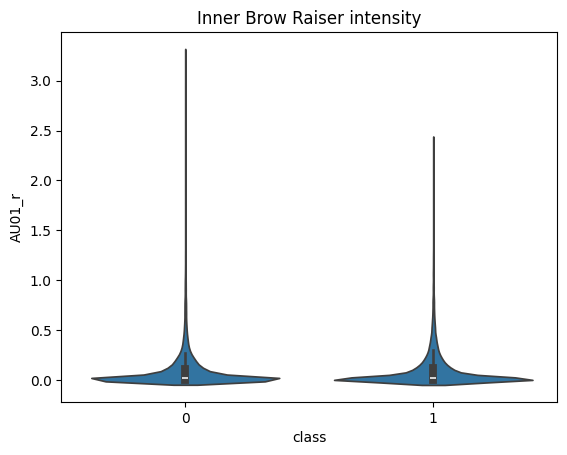

-----------------------------------
AU04_r


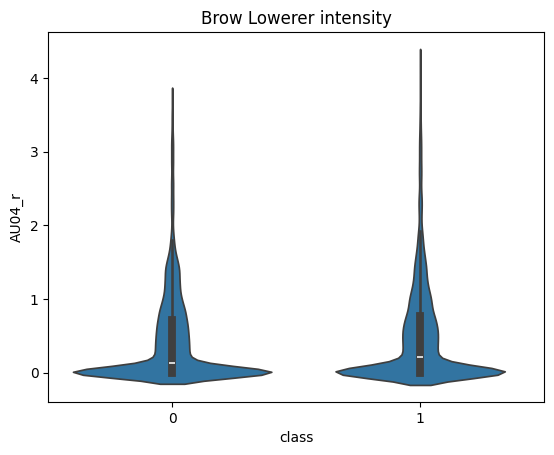

-----------------------------------
AU06_r


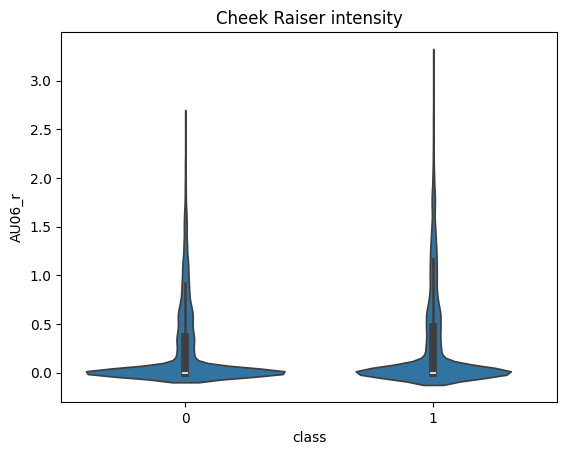

-----------------------------------
AU09_r


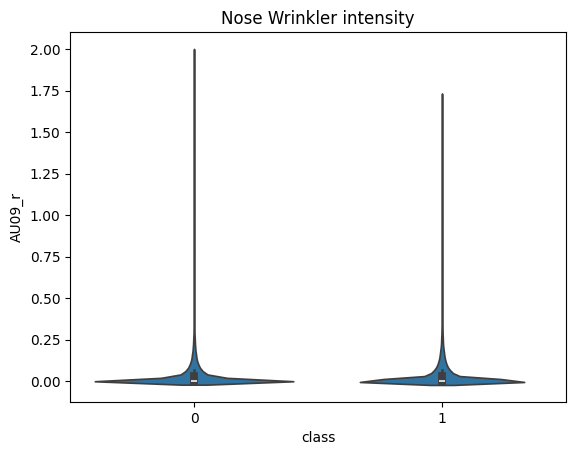

-----------------------------------
AU10_r


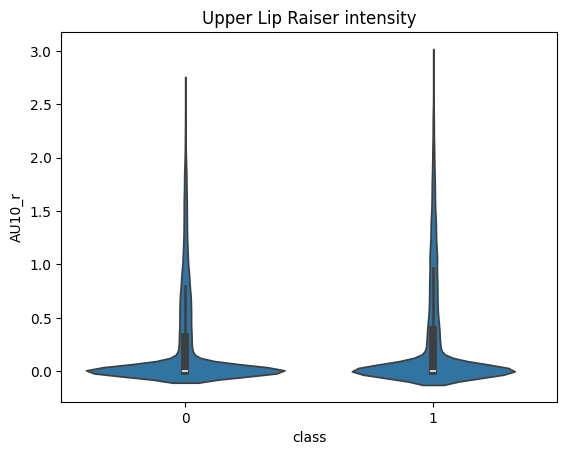

-----------------------------------
AU12_r


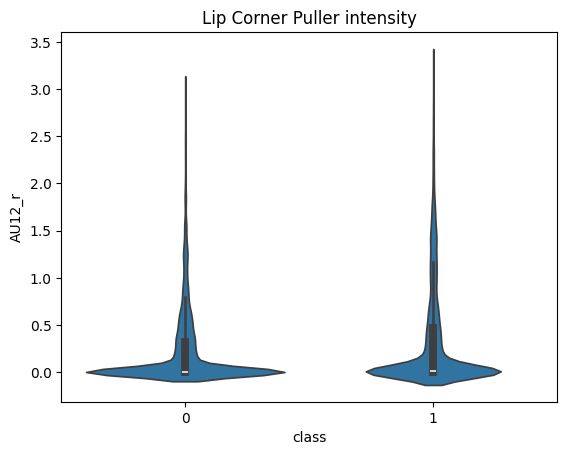

-----------------------------------
AU14_r


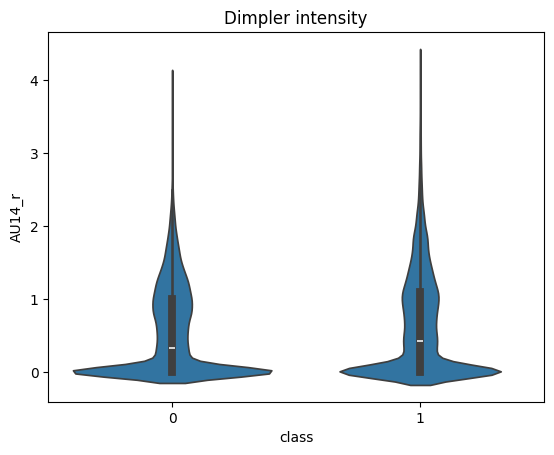

-----------------------------------
AU17_r


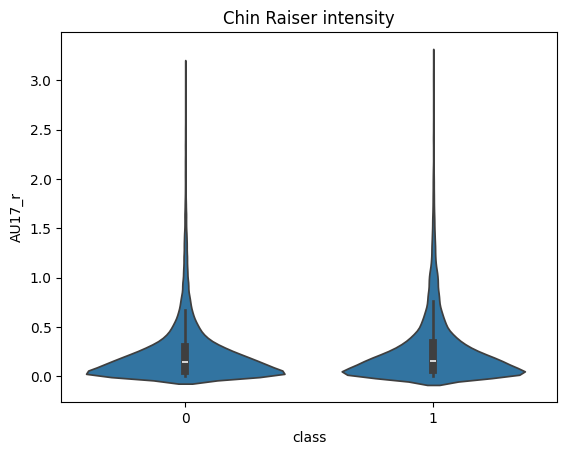

-----------------------------------
AU23_r


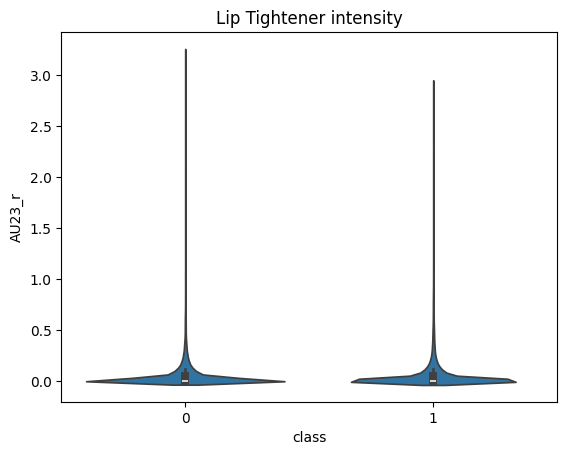

-----------------------------------
AU25_r


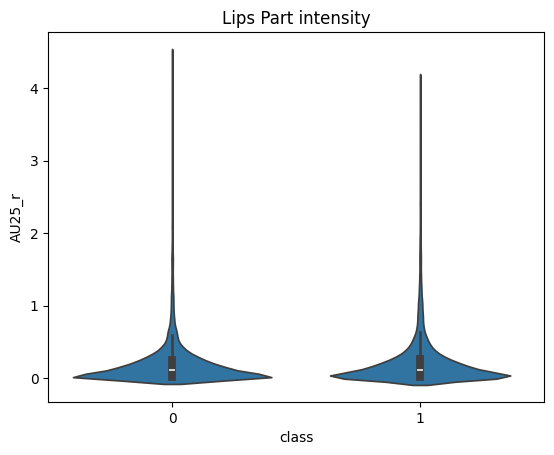

-----------------------------------
AU26_r


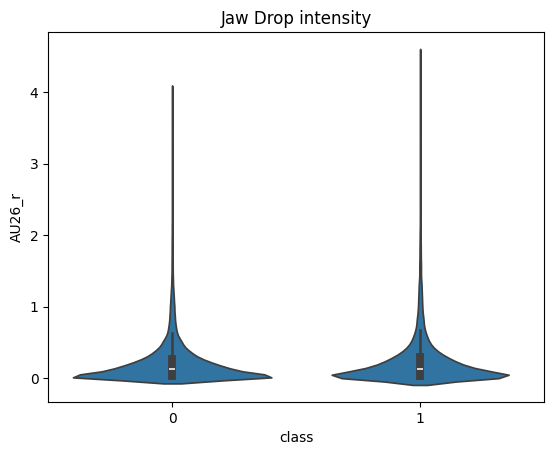

-----------------------------------
AU45_r


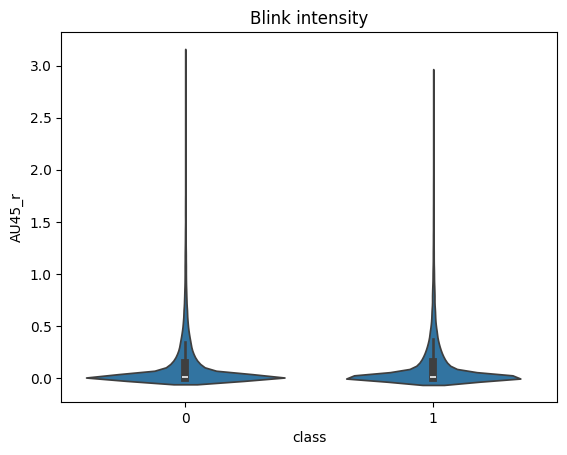

In [8]:
#do the same but now use whisker plot
sign_features_names = []
for feature in sign_features:
    print('-----------------------------------')
    print(feature)

    if 'AU' in feature:
        au = feature[2:4]
        #see if it's activation or intensity
        if 'c' in feature:
            type_f = ' presence'
        else:
            type_f = ' intensity'
        #get feature name from disctionary
        feature_name = au_to_motion[int(au)] + type_f
    else:
        feature_name = feature
    sign_features_names.append(feature_name)

    #get the data
    data = df[feature]
    #get the classes
    classes = df['class']
    data_0 = data[classes==0]
    data_1 = data[classes==1]
    #plot the data
    sns.violinplot(x=classes, y=data)
    plt.title(feature_name)
    plt.show()


   participant_id response_video  class  timestamp
0            1048           q_10      0      0.000
1            1048           q_10      0      0.033
2            1048           q_10      0      0.099
3            1048           q_10      0      0.132
4            1048           q_10      0      0.165
(41265, 16) (35909, 16)
[-0.015440888644120234 -0.03648861798593021 -0.06608957495342298
 -0.014673623641040082 -0.04892266727739742 -0.10697131774358874
 -0.06458262661669645 -0.04455538126892692 -0.015961797582987512
 -0.037203252435615085 -0.03742100433404995 -0.011447384530431998]


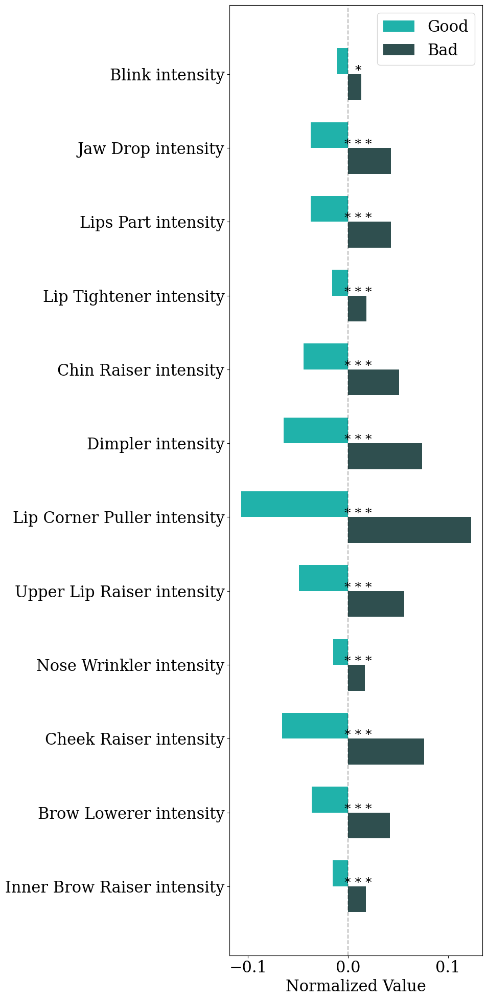

In [9]:
#do the same but normalize the data first, then use a single bar plot for all features, where features are shown in the y axis and there are 2 bars per feature (one per class)
 #import normalized df
from sklearn.preprocessing import StandardScaler
normed_df = pd.read_csv('../../data/30_3_data_norm.csv')

#normalize the data
norm_df = pd.DataFrame()
norm_df[df.columns[:4]] = normed_df[df.columns[:4]]
print(norm_df.head())
for feature in sign_features:
    norm_df[feature] = normed_df[feature]

#make font bigger
plt.rcParams.update({'font.size': 22})
#change font to serif
plt.rcParams.update({'font.family': 'serif'})
#change background to white grid
#plt.style.use('seaborn-whitegrid')


sign_features_names_no = [f[:-10] for f in sign_features_names]

#now, make single bar plot and plot all the features
    # Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 20))

# Set the y-axis with feature names
y_pos = range(len(sign_features))
ax.set_yticks(y_pos, labels=sign_features_names)
#below each one, put the respective p-value in a smaller font
p_vals_ast = []
for p in p_vals:
    if p < 0.001:
        p_vals_ast.append('* * *')
    elif p < 0.01:
        p_vals_ast.append('* *')
    elif p < 0.05:
        p_vals_ast.append('*')
for i in range(len(sign_features)):
    ax.text(0.01, i, p_vals_ast[i], fontsize=18, color='black', ha='center')

# Separate data by class
good_data = norm_df[norm_df['class'] == 0]
bad_data = norm_df[norm_df['class'] == 1]
print(good_data.shape, bad_data.shape)
print(good_data.values[:,4:].mean(axis = 0))

# Plot the bars
bar_width = 0.35
ax.barh([x + bar_width/2 for x in y_pos], good_data.values[:,4:].mean(axis=0), bar_width, label='Good', color='lightseagreen')
ax.barh([x - bar_width/2 for x in y_pos], bad_data.values[:,4:].mean(axis=0), bar_width, label='Bad', color='darkslategrey')#'coral')


# Add labels and legend
ax.set_xlabel('Normalized Value')
#ax.set_title('Normalized Feature Values by Class')
ax.legend()

#vertical dashed line at 0
ax.axvline(x=0, color='black', linestyle='--', alpha=0.3)

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()
    

   participant_id response_video  class  timestamp
0            1048           q_10      0      0.000
1            1048           q_10      0      0.033
2            1048           q_10      0      0.099
3            1048           q_10      0      0.132
4            1048           q_10      0      0.165
(41265, 16) (35909, 16)
[-0.015440888644120234 -0.03648861798593021 -0.06608957495342298
 -0.014673623641040082 -0.04892266727739742 -0.10697131774358874
 -0.06458262661669645 -0.04455538126892692 -0.015961797582987512
 -0.037203252435615085 -0.03742100433404995 -0.011447384530431998]


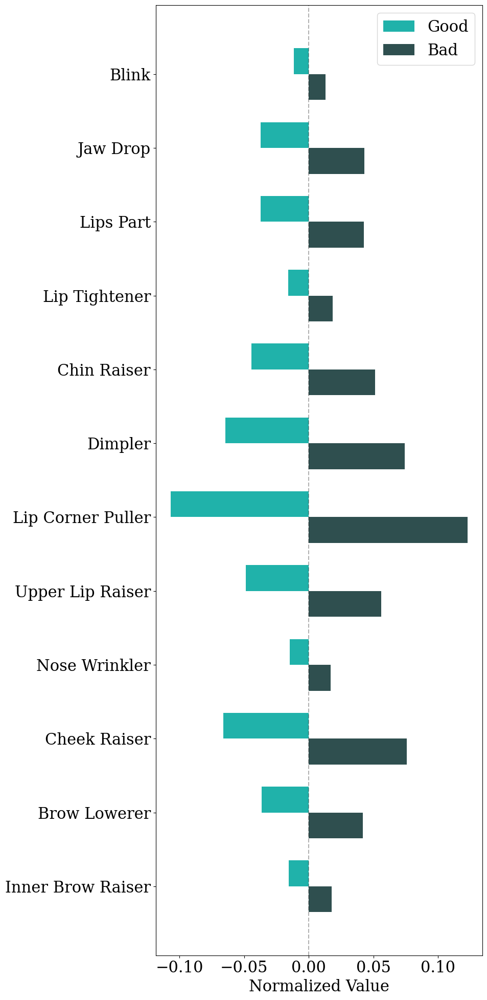

In [10]:
#do the same but normalize the data first, then use a single bar plot for all features, where features are shown in the y axis and there are 2 bars per feature (one per class)
 #import normalized df
from sklearn.preprocessing import StandardScaler
normed_df = pd.read_csv('../../data/30_3_data_norm.csv')

#save as tikz
#!python 3 -m pip install tikzplotlib
#import tikzplotlib


#normalize the data
norm_df = pd.DataFrame()
norm_df[df.columns[:4]] = normed_df[df.columns[:4]]
print(norm_df.head())
for feature in sign_features:
    norm_df[feature] = normed_df[feature]

#make font bigger
plt.rcParams.update({'font.size': 22})
#change font to serif
plt.rcParams.update({'font.family': 'serif'})
#change background to white grid
#plt.style.use('seaborn-whitegrid')


sign_features_names_no = [f[:-10] for f in sign_features_names]

#now, make single bar plot and plot all the features
    # Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 20))

# Set the y-axis with feature names
y_pos = range(len(sign_features))
ax.set_yticks(y_pos, labels=sign_features_names_no)

# Separate data by class
good_data = norm_df[norm_df['class'] == 0]
bad_data = norm_df[norm_df['class'] == 1]
print(good_data.shape, bad_data.shape)
print(good_data.values[:,4:].mean(axis = 0))

# Plot the bars
bar_width = 0.35
for i, feature in enumerate(sign_features):
    ax.barh([i + bar_width / 2], good_data[feature].mean(), bar_width, label='Good' if i == 0 else None, color='lightseagreen')
    ax.barh([i - bar_width / 2], bad_data[feature].mean(), bar_width, label='Bad' if i == 0 else None, color='darkslategrey')

    # Plot std
    #ax.errorbar(good_data[feature].mean(), i, xerr=good_data[feature].std(), fmt='o', color='black', capsize=5, capthick=2)
    #ax.errorbar(bad_data[feature].mean(), i, xerr=bad_data[feature].std(), fmt='o', color='black', capsize=5, capthick=2)

# Add labels and legend
ax.set_xlabel('Normalized Value')
#ax.set_title('Normalized Feature Values by Class')
ax.legend()

#vertical dashed line at 0
ax.axvline(x=0, color='black', linestyle='--', alpha=0.3)

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()
    
#save as tikz
#tikzplotlib.save("../../data/30_3_data_norm_bar.tex")
#save as png
fig.savefig("../../data/30_3_data_norm_bar.png", bbox_inches='tight', dpi=500)

[[0.0 0.0 0.0 ... 0.07847533632286995 0.022172949002217297 0.0]
 [0.0 0.0 0.0 ... 0.07623318385650225 0.04212860310421286 0.0]
 [0.0 0.0 0.0 ... 0.06053811659192825 0.04878048780487805 0.0]
 ...
 [0.0 0.0 0.0 ... 0.0067264573991031385 0.015521064301552109
  0.12580645161290321]
 [0.009174311926605503 0.0 0.0 ... 0.0 0.015521064301552109
  0.09354838709677418]
 [0.027522935779816512 0.0 0.0 ... 0.0 0.026607538802660754
  0.054838709677419356]]
(41265, 16) (35909, 16)
[0.02926212356844743 0.10491601449319476 0.07516418272143492
 0.0163400636683056 0.08429942849763752 0.06855261621729417
 0.12991576681560638 0.07510874176910687 0.017493958530419098
 0.04550371409988601 0.04793166658739702 0.04059708493098702]


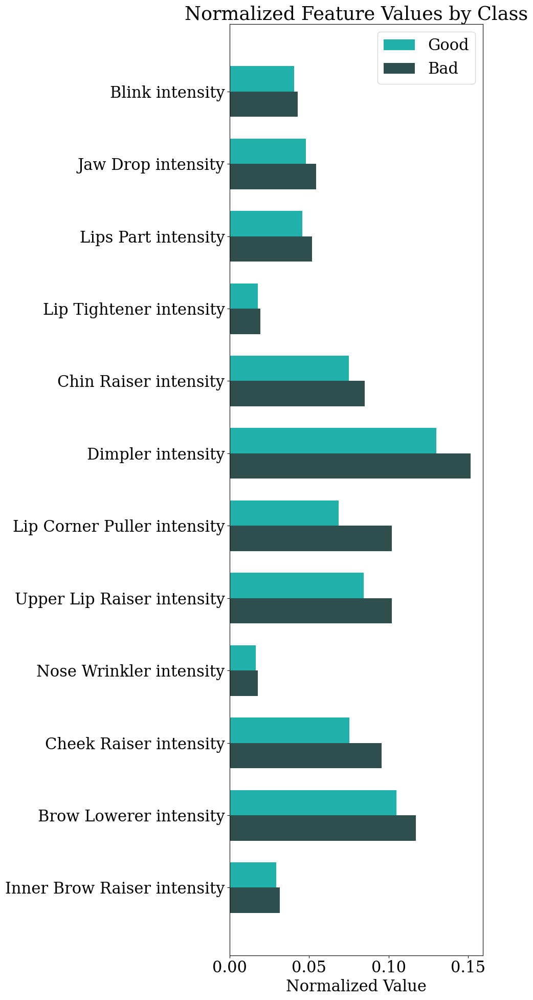

In [11]:
#do the same but normalize the data first, then use a single bar plot for all features, where features are shown in the y axis and there are 2 bars per feature (one per class)
 #import normalized df

#make font bigger
plt.rcParams.update({'font.size': 22})
#change font to serif
plt.rcParams.update({'font.family': 'serif'})
#change background to white grid
#plt.style.use('seaborn-whitegrid')

#normalize the data
norm_df = pd.DataFrame()
norm_df[df.columns[:4]] = df[df.columns[:4]]
for feature in sign_features:
    norm_df[feature] = df[feature].values / df[feature].max()

print(norm_df.values[:,4:])

#now, make single bar plot and plot all the features


# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 20))

# Set the y-axis with feature names
y_pos = range(len(sign_features))
ax.set_yticks(y_pos, labels=sign_features_names)

# Separate data by class
good_data = norm_df[norm_df['class'] == 0]
bad_data = norm_df[norm_df['class'] == 1]
print(good_data.shape, bad_data.shape)
print(good_data.values[:,4:].mean(axis = 0))

# Plot the bars
bar_width = 0.35
ax.barh([x + bar_width/2 for x in y_pos], good_data.values[:,4:].mean(axis=0), bar_width, label='Good', color='lightseagreen')
ax.barh([x - bar_width/2 for x in y_pos], bad_data.values[:,4:].mean(axis=0), bar_width, label='Bad', color='darkslategrey')#'coral')

# Add labels and legend
ax.set_xlabel('Normalized Value')
ax.set_title('Normalized Feature Values by Class')
ax.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


In [15]:
# now, get a table in latex with the action units and their p-values, only for significant ones

#make a dataframe with the p-values
df_p = pd.DataFrame()
df_p['Feature'] = sign_features
df_p ['AU'] = [f[:-10] for f in sign_features_names]
df_p['p-value'] = p_vals_ast

df_p



,Feature,AU,p-value
0,AU01_r,Inner Brow Raiser,* * *
1,AU04_r,Brow Lowerer,* * *
2,AU06_r,Cheek Raiser,* * *
3,AU09_r,Nose Wrinkler,* * *
4,AU10_r,Upper Lip Raiser,* * *
5,AU12_r,Lip Corner Puller,* * *
6,AU14_r,Dimpler,* * *
7,AU17_r,Chin Raiser,* * *
8,AU23_r,Lip Tightener,* * *
9,AU25_r,Lips Part,* * *


In [23]:
# change the action unit name to the corresponding facial movement
au_to_motion = {
    1: "Inner Brow Raiser",
    2: "Outer Brow Raiser",
    4: "Brow Lowerer",
    5: "Upper Lid Raiser",
    6: "Cheek Raiser",
    7: "Lid Tightener",
    9: "Nose Wrinkler",
    10: "Upper Lip Raiser",
    12: "Lip Corner Puller",
    14: "Dimpler",
    15: "Lip Corner Depressor",
    17: "Chin Raiser",
    20: "Lip Stretcher",
    23: "Lip Tightener",
    25: "Lips Part",
    26: "Jaw Drop",
    28: "Lip Suck",
    45: "Blink"
}
